In [80]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from plotly import tools
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go

import datetime
import random

import re
sns.set()

from scipy.stats.mstats import winsorize
import scipy.stats
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


#%matplotlib notebook
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sksurv.preprocessing import OneHotEncoder
from sksurv.linear_model import CoxPHSurvivalAnalysis
from sksurv.ensemble import GradientBoostingSurvivalAnalysis
from sksurv.linear_model import CoxnetSurvivalAnalysis
from sklearn.preprocessing import StandardScaler

In [82]:
df = pd.read_csv("./numeric_full.csv",  index_col='ID')



In [83]:
df.isna().sum()

Unnamed: 0                                                         0
LAB1300                                                            0
LAB1301                                                            0
LAB1307                                                            0
LAB1309                                                            0
LAB1311                                                            0
LAB1313                                                            0
LAB1314                                                            0
LAB1316                                                            0
LAB2404                                                            0
LAB2405                                                            0
LAB2406                                                            0
LAB2407                                                            0
LAB2419                                                            0
LAB2422                           

In [84]:
df.visceral_metastasis_location_ENCODEDmonths_survival.fillna(df.visceral_metastasis_location_ENCODEDmonths_survival.median(),inplace=True)

df.visceral_metastasis_location_ENCODEDspecific_death.fillna(df.visceral_metastasis_location_ENCODEDspecific_death.median(),inplace=True)

df.total_positives_slnb_ldn_ENCODEDspecific_death.fillna(df.total_positives_slnb_ldn_ENCODEDspecific_death.median(),inplace=True)   
df.total_positives_slnb_ldn_ENCODEDmonths_survival.fillna(df.total_positives_slnb_ldn_ENCODEDmonths_survival.median(),inplace=True)



In [85]:
x=df.drop(columns=['specific_death', 'months_survival'])
y=df[['specific_death','months_survival','train']]


In [86]:
x._get_numeric_data().shape

(3068, 127)

In [87]:
# Standardizing the features
x = StandardScaler().fit_transform(x._get_numeric_data())

In [88]:
from sklearn.decomposition import PCA
pca = PCA(n_components=60)
principalComponents = pca.fit_transform(x)

In [89]:
pc=pd.DataFrame(principalComponents)
pc.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59
0,-3.246951,-3.539292,-0.052196,-0.931538,0.177460,-0.455571,0.813800,-1.197019,1.609062,1.430471,0.013418,1.178130,0.547235,1.047814,-2.341015,-0.008111,-0.303853,-0.640372,-1.283151,1.437251,-0.465514,-0.492441,0.119692,-0.002327,-1.021544,0.517252,0.139961,0.100311,1.188797,0.768811,0.708480,-0.529075,-1.325607,1.007654,-0.820245,0.882422,-0.052655,-1.263079,0.002312,-0.425181,-0.252692,0.334923,0.710619,2.071346,-0.872943,-0.167731,0.203973,-1.642909,-1.178451,0.447610,0.253639,-0.235253,0.270405,0.216361,-1.092298,-0.494937,1.121864,0.020169,-0.524882,-0.735048
1,5.331149,5.076446,-0.489423,0.574733,-0.574691,3.740799,-0.111657,-0.759520,-0.993330,3.116537,0.359629,0.233958,1.611036,0.928432,-0.862168,1.104526,-1.072442,0.278617,0.201778,0.302725,-0.228385,0.569047,-0.109898,0.243926,-1.597265,-0.905955,0.415319,0.610322,-2.011901,-0.044159,0.498960,-0.733155,-0.002251,0.474454,-0.524934,0.100244,0.216915,-0.179031,0.226123,-2.105982,0.553693,0.583499,0.453929,-0.106829,-0.140802,-0.118365,0.709583,-0.072995,-1.213298,0.239065,-0.310105,0.983026,0.146313,0.493650,0.185725,0.296527,-0.532163,0.631634,-0.926503,-1.022539
2,-3.040456,-3.259466,-0.197280,-1.487582,-0.999393,0.123098,1.329383,0.167525,0.072647,0.320342,-0.259212,0.607158,-0.513710,0.910770,1.455780,0.041547,0.149943,2.313290,0.233998,-0.654349,-1.307784,0.672236,0.786812,0.813073,-0.266399,-0.212205,-0.125668,-0.589608,0.476271,-2.344871,-0.206146,-1.144316,-0.372895,-1.185231,-0.313256,0.843248,-0.425347,-0.925512,-1.435971,-0.839349,-0.953355,0.434705,0.508175,-0.046813,-0.980479,-0.280412,0.811169,0.159192,-0.526419,1.107506,0.095887,-0.302452,-0.527208,0.842637,0.358787,-0.186309,-0.328152,0.196318,0.095053,0.286864
3,-2.324984,-2.647603,-2.737280,0.893020,-0.256171,0.732495,1.403581,1.099567,0.853721,-1.221017,-1.412011,-0.387063,-1.074018,0.661352,1.610781,-0.433506,-2.121181,0.782128,-0.473331,-0.821875,0.607440,-1.096128,-0.864320,-0.422282,0.735029,-0.617382,1.082542,-0.565956,1.537177,-1.104056,-0.601434,-0.071298,-1.241571,-0.769386,0.345289,0.949031,0.588604,-0.508728,0.377630,0.322873,0.642338,-0.441834,0.003502,-1.882352,-0.886391,1.421491,0.289748,-0.140772,-0.699718,0.793885,-0.869374,-0.088459,0.765211,-0.092399,0.606438,-0.116250,-0.372093,-0.798434,-0.651386,0.331811
4,-2.174115,-2.843920,-2.914830,-1.475988,-0.731675,1.135411,2.029711,-0.975478,0.996383,-0.493585,-0.889557,-0.364398,-0.902690,0.103084,0.708212,-0.776855,-1.448080,1.127075,-0.282794,-0.418817,-0.640510,-0.686635,-0.599627,-0.351906,0.686402,0.335778,-0.031000,-1.275011,0.124076,0.639624,-0.345440,-0.157692,0.204488,0.176071,-0.715489,-0.237007,1.021724,-0.468014,-0.719325,0.339226,1.400985,0.656659,0.472297,-0.273031,-0.711908,0.556537,0.981760,-0.799094,-0.698953,0.417428,0.579608,0.016330,-0.457158,-0.692714,0.464869,-0.803342,-0.124046,-0.346418,-1.058787,-0.195835


In [90]:
df['cutaneous_biopsy_mitotic_index']

ID
ID2         0.0
ID4         0.0
ID6         0.0
ID9         2.0
ID17        0.0
ID20        0.0
ID50        0.0
ID87        0.0
ID125       0.0
ID168       0.0
ID202       0.0
ID220       1.0
ID273       0.0
ID274       0.0
ID278       0.0
ID291       0.0
ID299       0.0
ID310       0.0
ID321       0.0
ID324       0.0
ID329       0.0
ID332       0.0
ID338       0.0
ID339       0.0
ID347       0.0
ID351       0.0
ID352       0.0
ID353       0.0
ID370       0.0
ID372       0.0
ID387       0.0
ID389       0.0
ID397       0.0
ID401       0.0
ID407       0.0
ID414       0.0
ID415       0.0
ID417       0.0
ID420       0.0
ID426       0.0
ID430       0.0
ID432       0.0
ID439       0.0
ID444       0.0
ID447       0.0
ID448       0.0
ID451       0.0
ID453       0.0
ID454       0.0
ID457       0.0
ID459       0.0
ID463       0.0
ID470       0.0
ID472       0.0
ID477       0.0
ID480       0.0
ID482       0.0
ID483       9.0
ID484       0.0
ID501       0.0
ID506       2.0
ID508       0.0
ID509

In [91]:
pc.index=df.index
pc['train']=df['train']
#pc['cutaneous_biopsy_breslow']=df['cutaneous_biopsy_breslow']
#pc['cutaneous_biopsy_mitotic_index']=df['cutaneous_biopsy_mitotic_index']
pc.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,train
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID2,-3.246951,-3.539292,-0.052196,-0.931538,0.177460,-0.455571,0.813800,-1.197019,1.609062,1.430471,0.013418,1.178130,0.547235,1.047814,-2.341015,-0.008111,-0.303853,-0.640372,-1.283151,1.437251,-0.465514,-0.492441,0.119692,-0.002327,-1.021544,0.517252,0.139961,0.100311,1.188797,0.768811,0.708480,-0.529075,-1.325607,1.007654,-0.820245,0.882422,-0.052655,-1.263079,0.002312,-0.425181,-0.252692,0.334923,0.710619,2.071346,-0.872943,-0.167731,0.203973,-1.642909,-1.178451,0.447610,0.253639,-0.235253,0.270405,0.216361,-1.092298,-0.494937,1.121864,0.020169,-0.524882,-0.735048,1
ID4,5.331149,5.076446,-0.489423,0.574733,-0.574691,3.740799,-0.111657,-0.759520,-0.993330,3.116537,0.359629,0.233958,1.611036,0.928432,-0.862168,1.104526,-1.072442,0.278617,0.201778,0.302725,-0.228385,0.569047,-0.109898,0.243926,-1.597265,-0.905955,0.415319,0.610322,-2.011901,-0.044159,0.498960,-0.733155,-0.002251,0.474454,-0.524934,0.100244,0.216915,-0.179031,0.226123,-2.105982,0.553693,0.583499,0.453929,-0.106829,-0.140802,-0.118365,0.709583,-0.072995,-1.213298,0.239065,-0.310105,0.983026,0.146313,0.493650,0.185725,0.296527,-0.532163,0.631634,-0.926503,-1.022539,1
ID6,-3.040456,-3.259466,-0.197280,-1.487582,-0.999393,0.123098,1.329383,0.167525,0.072647,0.320342,-0.259212,0.607158,-0.513710,0.910770,1.455780,0.041547,0.149943,2.313290,0.233998,-0.654349,-1.307784,0.672236,0.786812,0.813073,-0.266399,-0.212205,-0.125668,-0.589608,0.476271,-2.344871,-0.206146,-1.144316,-0.372895,-1.185231,-0.313256,0.843248,-0.425347,-0.925512,-1.435971,-0.839349,-0.953355,0.434705,0.508175,-0.046813,-0.980479,-0.280412,0.811169,0.159192,-0.526419,1.107506,0.095887,-0.302452,-0.527208,0.842637,0.358787,-0.186309,-0.328152,0.196318,0.095053,0.286864,1
ID9,-2.324984,-2.647603,-2.737280,0.893020,-0.256171,0.732495,1.403581,1.099567,0.853721,-1.221017,-1.412011,-0.387063,-1.074018,0.661352,1.610781,-0.433506,-2.121181,0.782128,-0.473331,-0.821875,0.607440,-1.096128,-0.864320,-0.422282,0.735029,-0.617382,1.082542,-0.565956,1.537177,-1.104056,-0.601434,-0.071298,-1.241571,-0.769386,0.345289,0.949031,0.588604,-0.508728,0.377630,0.322873,0.642338,-0.441834,0.003502,-1.882352,-0.886391,1.421491,0.289748,-0.140772,-0.699718,0.793885,-0.869374,-0.088459,0.765211,-0.092399,0.606438,-0.116250,-0.372093,-0.798434,-0.651386,0.331811,1
ID17,-2.174115,-2.843920,-2.914830,-1.475988,-0.731675,1.135411,2.029711,-0.975478,0.996383,-0.493585,-0.889557,-0.364398,-0.902690,0.103084,0.708212,-0.776855,-1.448080,1.127075,-0.282794,-0.418817,-0.640510,-0.686635,-0.599627,-0.351906,0.686402,0.335778,-0.031000,-1.275011,0.124076,0.639624,-0.345440,-0.157692,0.204488,0.176071,-0.715489,-0.237007,1.021724,-0.468014,-0.719325,0.339226,1.400985,0.656659,0.472297,-0.273031,-0.711908,0.556537,0.981760,-0.799094,-0.698953,0.417428,0.579608,0.016330,-0.457158,-0.692714,0.464869,-0.803342,-0.124046,-0.346418,-1.058787,-0.195835,1


In [92]:
train = pc[pc['train'] == 1]
test = pc[pc['train'] == 0]

In [93]:
#!/usr/bin/python
"""
Copyright 2019 Accenture and/or its affiliates.  All Rights Reserved.  
You may not use, copy, modify, and/or distribute this code and/or its documentation without permission from Accenture.
Please contact the Advanced Analytics-Operations Analytics team and/or Frode Huse Gjendem (lead) with any questions.

\brief This is the starter script for the Accenture's Health Datathon 2019 competition.

\version 1.0

\date $Date: 2019/05

"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



'''
Function to select certain/uncertain weights
You will not need to ever create the following parameters
They are created (and this is called) within the next function "calc_weights"
@paramters
    patient_info: vector holding every month you want to evaluate, 1 for whichever column months_survived = 1, NA otherwise
    df_aux: vector that contains the probability of survival at each month, fixed values for a test set
@return
    the vector of weights

'''
def get_weights(patient_info, df_aux):
    x = np.array(patient_info)
    
    # weight will always be 1 if we know they are dead
    if (x[~np.isnan(x)][0]==1):
        x = np.ones_like(x)
    else:
        y = np.argwhere(~np.isnan(x))
        not_zero_index = y.ravel()[0]
        
        x[:not_zero_index] = 1
        x[not_zero_index:] = df_aux['prob'][not_zero_index:]
    return (x)


'''
Function to calculate the weight matrix
@paramters
    y_df: The test set for which you are calculating the weights
        Format: Index = ID, Rows = patients, cols = ['specific_death', 'months_survival']
@ return
    the weights matrix with the weights for each patient at each time t  
'''
def calc_weights(y_df):
    
    # Create a matrix with patient id in the index and months_survival as header, specific_death as values.   
    df_y_pivot = y_df.pivot(columns="months_survival", values='specific_death')
    # The table changes order of rows after pivoting it, we need to reorder it again by doing reindex_axis.
    df_y_pivot= df_y_pivot.reindex(y_df.index, axis=0).reset_index()
    
    # We need to calculate the weights based on the entire time initially, then cut it off after the fact
    all_months_survival = np.arange(0,y_df.months_survival.max()+1)
    months_complementary = np.setdiff1d(all_months_survival, y_df.months_survival.unique())
    df_complementary = pd.DataFrame(np.nan, index=df_y_pivot.index, columns=months_complementary )
    df_y_pivot = pd.concat([df_y_pivot,df_complementary],axis=1)[all_months_survival]
    
    # Get aux matrix to provide in the get_weights function. 
    # Probability of being alive at each month based on patients you are certain about (excluding patients censored pior to month)
    df_aux = pd.DataFrame(data=np.arange(0,y_df.months_survival.max()+1),columns=["months_survival"])
    df_aux['prob_num'] = df_aux['months_survival'].apply(lambda x : (y_df['months_survival'] > x).values.sum())
    df_aux['prob_den'] = df_aux['months_survival'].apply(lambda x : ((y_df['months_survival'] < x) & (y_df['specific_death']==1)).values.sum())
    df_aux['prob'] = (df_aux['prob_num']/(df_aux['prob_num']+df_aux['prob_den']))

    df_aux = df_aux[['months_survival','prob']].sort_values('months_survival').reset_index().drop('index',axis=1)

    
    #Get weights
    df_weights = df_y_pivot.apply(lambda x: get_weights(x,df_aux),axis=1)
    
    new_weights = pd.DataFrame(np.vstack(df_weights),columns=all_months_survival )

    new_weights = np.apply_along_axis(np.cumprod, 1, new_weights)
    
    new_weights = pd.DataFrame(new_weights)
    
    return new_weights


''' 
Fill up the Y_true matrix's value 
You will not need to ever creat the following parameter.
It is created (and this is called) within the next function "populate_actual".
@paramters
    patient_info: vector holding every month you want to evaluate, 1 for whichever column months_survived = 1, NA otherwise
'''
def apply_non_zero(patient_info):
    x = np.array(patient_info)
    if (x[~np.isnan(x)][0]==0):
        x = np.ones_like(x)
    else:
        y = np.argwhere(~np.isnan(x))
        not_zero_index = y.ravel()[0]
        x[:(not_zero_index)] = 1
        x[(not_zero_index):] = 0   

    return (pd.Series(x))

 
'''
Build the Y_true matrix
@paramters
    y_df: The test set for which you are calculating the weights
        Format: Index = ID, Rows = patients, cols = ['specific_death', 'months_survival']
    years: Number of years for which you want to evaluate your model. Default = 10.
'''
def populate_actual(y_df, years = 10):
    #Create a matrix by pivoting table
    df_y_true_pivot = y_df.pivot(columns = "months_survival", values='specific_death')
    #The table changes order of rows after pivoting it, we need to reorder it again by doing reindex_axis.
    df_y_true_pivot = df_y_true_pivot.reindex(y_df.index, axis=0).reset_index()


    all_months_survival = np.arange(0,y_df.months_survival.max()+1)
    #Get the month that we don't have any patient record in our dataset.
    
    months_complementary = np.setdiff1d(all_months_survival, y_df.months_survival.unique())
    df_complementary = pd.DataFrame(np.nan, index=df_y_true_pivot.index, columns=months_complementary )
    
    #Add the complementary dataframe to create a full-month dataframe
    df_y_true_pivot = pd.concat([df_y_true_pivot,df_complementary],axis=1)[all_months_survival]

    # Fill NaN value to either 0 or 1
    df_y_pro = df_y_true_pivot.apply(lambda x: apply_non_zero(x),axis=1)
    
    
    chosen_months_survival = np.arange(0,years*12+1)
    df_y_pro = df_y_pro[chosen_months_survival].values
    
    return df_y_pro


'''
Function to compute the weighted Brier score
@paramters
    pred: is the prediction matrix
        Format: Index = ID, Rows = patients, cols = months, values = probability of being alive (alive = 1, dead = 0)
    actual: is the actual value matrix.
        Format: Index = ID, Rows = patients, cols = ['specific_death', 'months_survival']
    weights: is the matrix of weights associated to the predictions
    years_cutoff: is the time for which the error is computed
@return
    the vector of actual status over time
'''
def brier_score_loss_weighted(pred, actual, weights, years_cutoff = 10):
    
    # Select the desired period
    weights = weights.iloc[:,:(12*years_cutoff)+1]
    
    # obtain the unique time values in the y data of your survival data
    unique_times = range(0, (12*years_cutoff)+1)
    
    # fill an empty matrix to hold the weights
    errors = np.empty([len(actual), len(unique_times)])
    
    # subset y_pred to be the number of years you want
    m_y_pred = pred.iloc[:,:(max(unique_times)+1)]

    try:
        m_y_true = np.matrix(populate_actual(actual, years_cutoff))
        m_y_pred = np.matrix(m_y_pred)
        m_weights = np.matrix(weights)
    except:
        print("Matrix format is required for y_true, y_predict and weights")
            
    errors = np.multiply(np.power(m_y_pred - m_y_true,2),m_weights)
    
    error = pd.DataFrame(errors)
    time = years_cutoff * 12
    
    # calculate the average error of all patients for each time
    all_dates = error.mean(axis=0)
    
    # subset desired dates
    desired_dates = pd.DataFrame(all_dates[0:(time+1)])
    
    # calculate the average error up until a point in time
    desired_error = np.mean(desired_dates)
    
    return desired_error

In [94]:
# Feature selection
b_x_train = train.drop(columns='train')
b_y_train = y.query('train==1')[['specific_death', 'months_survival']]

In [95]:
b_test = test.drop(columns='train')

In [96]:
b_y_train.isnull().sum()

specific_death     0
months_survival    0
dtype: int64

In [97]:
def fit_and_prepare(x_train, y_train, test_df):
    
    # 3.1. Prepare Y-----
    y_train.specific_death = y_train.specific_death.astype(bool)
    
    # Transform it into a structured array
    y_train = y_train.to_records(index = False)
    
    # 3.2. Prepare X-----
    # obtain the x variables that are categorical
    categorical_feature_mask = x_train.dtypes==object

    # Filter categorical columns using mask and turn it into a list
    categorical_cols = x_train.columns[categorical_feature_mask].tolist()

    # Ensure categorical columns are category type
    for col in categorical_cols:
        x_train[col] = x_train[col].astype('category')
        test_df[col] = test_df[col].astype('category')
    
    # 3.3. Fit model-----
    # initiate
    encoder = OneHotEncoder()
    estimator = CoxPHSurvivalAnalysis(alpha=1000)
    
    # fit model
    estimator.fit(encoder.fit_transform(x_train), y_train)
    
    # transform the test variables to match the train
    x_test = encoder.transform(test_df)
    
    return (estimator, x_test, x_train, y_train)

In [98]:
estimator, x_test, x_train, y_train = fit_and_prepare(b_x_train,b_y_train, test)

In [99]:
estimator_b, x_test_b, x_train_b, y_train_b = fit_and_prepare(b_x_train, b_y_train, b_test)

In [100]:
pred_surv = estimator.predict(x_test)
pred_surv[0]

-1.211749558909418

In [101]:
x_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID108,-2.433404,-4.138571,-0.229232,-0.591251,0.214175,0.829337,2.044111,-2.794844,1.769517,1.376739,0.382306,0.759517,0.331053,0.347183,-1.108767,0.237205,0.231310,1.620680,-0.218247,0.850427,0.847728,-0.429433,-0.667725,0.359116,0.180411,0.340323,-0.217590,-1.210067,0.500111,-0.048132,1.230984,0.213399,0.127502,-1.343523,-1.000582,-0.784468,-0.117250,0.374118,0.944842,0.369457,-0.676878,-0.467149,-0.193991,-0.035275,0.329363,0.626988,0.540691,1.333589,-0.060057,-0.302562,0.500462,-0.392749,-0.663630,0.132174,1.155797,-0.257603,-0.042965,0.090295,0.589477,0.548483
ID134,6.358619,0.005738,-3.642481,1.427411,1.762463,-1.332604,-1.439481,0.415991,0.335824,-0.001513,-0.487318,1.280536,0.133762,1.724696,-1.877232,-0.298120,-0.401773,-0.520497,-0.553786,0.363520,-0.611339,-0.807840,0.000196,-0.695618,0.197163,0.992198,0.501641,-0.981269,-0.123245,-1.245738,0.732874,0.276841,0.280452,-0.309561,0.179024,-0.293080,0.305546,-0.352296,0.306734,-0.643302,1.123565,-0.553042,0.017697,-0.095255,1.052228,-0.502232,-0.574419,0.050162,0.773452,-0.321418,1.185029,0.107855,0.221536,0.672868,0.110085,-0.012443,0.039440,0.112055,0.060737,0.240618
ID292,-2.714511,-2.660151,0.349458,-0.679544,0.501638,-1.332107,0.062292,-2.837407,1.524609,2.062235,1.082786,1.652813,1.182574,1.638211,-1.179350,-1.556769,0.314406,0.626509,-0.642272,0.860898,0.290286,1.843985,1.322677,-0.797354,-0.314310,-0.565576,2.154541,-0.775541,0.138378,-0.418496,-0.342622,-1.080618,2.049222,1.500633,0.558287,-0.571854,1.306008,-2.573457,3.413196,0.564882,-1.412371,0.518745,-2.064764,0.685395,-1.333991,0.098476,1.453064,-0.486261,-0.543713,-1.353760,-0.284359,-0.545080,0.575141,-1.156706,0.723631,0.405160,-0.156588,-0.094016,0.040071,-0.718291
ID306,-3.502669,-2.139809,0.699871,2.088744,1.323775,-0.772846,-0.495413,-1.051526,1.100164,1.785666,0.219208,0.957157,0.767663,0.913047,-0.844163,-0.930535,0.419040,0.945006,-1.031558,-0.275920,-1.021362,-1.496976,0.363268,-0.273121,-0.284649,0.600369,2.283128,0.099588,-0.256864,-0.617540,-1.114019,0.536828,0.719086,-0.270028,0.046417,0.028052,-0.895171,-0.571357,0.566266,-0.091246,0.265669,-0.248398,0.126196,0.302000,0.549220,0.575629,-0.099179,0.492522,0.138817,0.128527,-0.437507,-0.107134,0.648451,-0.350026,0.333917,-0.217969,0.119291,-0.123989,-0.196626,-0.358022
ID308,-3.077753,-0.357479,3.498223,-2.046190,4.979750,0.638389,-0.120862,-0.852777,-0.366822,0.467220,1.164043,-1.246748,-0.231762,-1.500282,1.210916,-1.558654,0.880613,0.862949,-1.124737,-2.348417,-0.635575,-1.438679,-0.089206,-1.128691,-0.693581,0.361087,0.432506,-0.532263,-0.825110,-0.251029,-0.073844,-0.403529,1.624108,0.581252,0.456291,-0.352119,-0.941963,0.912029,1.338334,0.215290,0.896159,0.597605,-0.219927,0.170818,-0.282617,0.486050,0.030283,-0.062059,-0.795597,-0.199881,0.072618,0.300387,0.057431,-0.557125,0.400594,-0.001774,-0.581898,0.710581,-1.458814,-0.260795


In [102]:
def get_probabilities(x_test, estimator):
    
    pred_surv = estimator.predict_survival_function(x_test)

    # Get the "X's" or time of each data point
    times = pred_surv[0].x

    # Create an empty pandas dataframes with these times as the columns
    pred_df = pd.DataFrame(columns = times)

    # Convert each row to a pandas series row (transpose) with the index as these x times and append it to the df
    for i in range(0, len(x_test)):
        pred_df = pred_df.append(pd.DataFrame(pred_surv[i].y).set_index(times).T) 

    pred_df = pred_df.set_index(x_test.index)

    return pred_df

In [103]:
# 4.2 store the predictions
predictions_b = get_probabilities(x_test_b, estimator_b)

In [104]:
y_train

rec.array([(False, 179.), (False, 127.), (False,  67.), ...,
           (False, 102.), (False,  66.), (False,  79.)],
          dtype=[('specific_death', '?'), ('months_survival', '<f8')])

In [105]:
predictions_b

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,164.0,165.0,166.0,167.0,168.0,169.0,170.0,171.0,172.0,173.0,174.0,175.0,176.0,177.0,178.0,179.0,180.0,181.0,182.0,183.0,184.0,185.0,186.0,187.0,188.0,189.0,190.0,191.0,192.0,193.0,194.0,195.0,196.0,197.0,198.0,199.0,200.0,201.0,202.0,203.0,204.0,205.0,206.0,207.0,208.0,209.0,210.0,211.0,212.0,213.0,214.0,215.0,216.0,217.0,218.0,219.0,220.0,221.0,222.0,223.0,224.0,225.0,226.0,227.0,228.0,229.0,230.0,231.0,232.0,233.0,234.0,235.0,236.0,237.0,238.0,239.0,240.0,241.0,242.0,243.0,244.0,245.0,246.0,247.0,248.0,249.0,250.0,251.0,252.0,253.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID108,1.0,1.0,0.999947,0.999894,0.999785,0.999512,0.999265,0.999001,0.998596,0.998152,0.997999,0.997766,0.997441,0.996778,0.996441,0.996186,0.995585,0.994714,0.994335,0.993951,0.993078,0.992578,0.992373,0.991755,0.991438,0.990476,0.989702,0.988918,0.988343,0.987879,0.987179,0.986589,0.986345,0.984871,0.983866,0.982851,0.981804,0.980598,0.979644,0.979094,0.978675,0.978391,0.977373,0.976633,0.976184,0.975729,0.975266,0.974800,0.974329,0.973852,0.973046,0.972233,0.971575,0.971240,0.970904,0.970563,0.970563,0.969691,0.969159,0.968440,0.968258,0.967887,0.967324,0.967131,0.966548,0.966548,0.965556,0.965355,0.965153,0.964537,0.963689,0.962394,0.961731,0.961051,0.960819,0.960819,0.960106,0.959141,0.958649,0.958149,0.958149,0.957893,0.957377,0.957114,0.956583,0.955492,0.955215,0.954933,0.954647,0.954068,0.954068,0.953771,0.953471,0.953471,0.952555,0.951933,0.951933,0.951933,0.951933,0.951607,0.951274,0.951274,0.951274,0.950225,0.950225,0.950225,0.950225,0.949845,0.949463,0.949463,0.949463,0.948676,0.948676,0.947872,0.947872,0.947872,0.947872,0.947449,0.947449,0.947449,0.946558,0.946558,0.946558,0.946081,0.946081,0.945590,0.945590,0.945590,0.945078,0.945078,0.945078,0.944540,0.944540,0.944540,0.943987,0.943431,0.943431,0.943431,0.943431,0.943431,0.943431,0.942826,0.942826,0.942826,0.942826,0.942826,0.942826,0.942826,0.942826,0.942119,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.939494,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.937392,0.937392,0.937392,0.937392,0.937392,0.937392,0.937392,0.937392,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496
ID134,1.0,1.0,0.999889,0.999776,0.999547,0.998

In [106]:
# 4.3 Compute estimate of the survival curves
pred_curves = estimator_b.predict_survival_function(x_test_b)

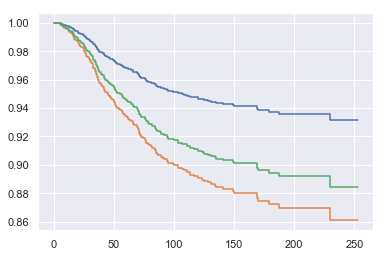

In [107]:
for curve in pred_curves[0:3]:
    plt.step(curve.x, curve.y, where="post")

In [108]:
from sksurv.metrics import concordance_index_censored

prediction = estimator.predict(x_train)
result = concordance_index_censored(y_train['specific_death'], 
                                    y_train["months_survival"],
                                    prediction)
result[0]

0.8590388992643716

In [109]:
from sksurv.metrics import concordance_index_censored

pred_b = estimator_b.predict(x_train_b)
result = concordance_index_censored(y_train_b['specific_death'], 
                                    y_train_b["months_survival"],
                                    pred_b)
result[0]

0.8590388992643716

In [110]:
predictions_df = pd.DataFrame(predictions_b)

In [111]:

# Please, remember that rows NEED TO BE indexed by patient IDs and columns MUST be ordered from T0 to T120

# First subset to 10 years
predictions_10yr = predictions_df.iloc[:,:121]

#Rename columns to Time periods
columns = predictions_10yr.columns.values
new_columns = ['T' + str(s) for s in columns]
predictions_10yr.columns = new_columns

# Write the final CSV file
# Please, remember than in order to make the submission you need to create a .zip file ONLY with the csv
pd.DataFrame(predictions_10yr).to_csv('sample-submission-cox.csv')

In [112]:
pd.DataFrame(predictions_10yr)

,T0.0,T1.0,T2.0,T3.0,T4.0,T5.0,T6.0,T7.0,T8.0,T9.0,T10.0,T11.0,T12.0,T13.0,T14.0,T15.0,T16.0,T17.0,T18.0,T19.0,T20.0,T21.0,T22.0,T23.0,T24.0,T25.0,T26.0,T27.0,T28.0,T29.0,T30.0,T31.0,T32.0,T33.0,T34.0,T35.0,T36.0,T37.0,T38.0,T39.0,T40.0,T41.0,T42.0,T43.0,T44.0,T45.0,T46.0,T47.0,T48.0,T49.0,T50.0,T51.0,T52.0,T53.0,T54.0,T55.0,T56.0,T57.0,T58.0,T59.0,T60.0,T61.0,T62.0,T63.0,T64.0,T65.0,T66.0,T67.0,T68.0,T69.0,T70.0,T71.0,T72.0,T73.0,T74.0,T75.0,T76.0,T77.0,T78.0,T79.0,T80.0,T81.0,T82.0,T83.0,T84.0,T85.0,T86.0,T87.0,T88.0,T89.0,T90.0,T91.0,T92.0,T93.0,T94.0,T95.0,T96.0,T97.0,T98.0,T99.0,T100.0,T101.0,T102.0,T103.0,T104.0,T105.0,T106.0,T107.0,T108.0,T109.0,T110.0,T111.0,T112.0,T113.0,T114.0,T115.0,T116.0,T117.0,T118.0,T119.0,T120.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID108,1.0,1.0,0.999947,0.999894,0.999785,0.999512,0.999265,0.999001,0.998596,0.998152,0.997999,0.997766,0.997441,0.996778,0.996441,0.996186,0.995585,0.994714,0.994335,0.993951,0.993078,0.992578,0.992373,0.991755,0.991438,0.990476,0.989702,0.988918,0.988343,0.987879,0.987179,0.986589,0.986345,0.984871,0.983866,0.982851,0.981804,0.980598,0.979644,0.979094,0.978675,0.978391,0.977373,0.976633,0.976184,0.975729,0.975266,0.974800,0.974329,0.973852,0.973046,0.972233,0.971575,0.971240,0.970904,0.970563,0.970563,0.969691,0.969159,0.968440,0.968258,0.967887,0.967324,0.967131,0.966548,0.966548,0.965556,0.965355,0.965153,0.964537,0.963689,0.962394,0.961731,0.961051,0.960819,0.960819,0.960106,0.959141,0.958649,0.958149,0.958149,0.957893,0.957377,0.957114,0.956583,0.955492,0.955215,0.954933,0.954647,0.954068,0.954068,0.953771,0.953471,0.953471,0.952555,0.951933,0.951933,0.951933,0.951933,0.951607,0.951274,0.951274,0.951274,0.950225,0.950225,0.950225,0.950225,0.949845,0.949463,0.949463,0.949463,0.948676,0.948676,0.947872,0.947872,0.947872,0.947872,0.947449,0.947449,0.947449,0.946558
ID134,1.0,1.0,0.999889,0.999776,0.999547,0.998970,0.998450,0.997892,0.997040,0.996104,0.995783,0.995292,0.994608,0.993213,0.992505,0.991968,0.990707,0.988879,0.988083,0.987279,0.985449,0.984403,0.983974,0.982682,0.982018,0.980008,0.978394,0.976759,0.975561,0.974594,0.973137,0.971911,0.971403,0.968342,0.966259,0.964157,0.961991,0.959498,0.957530,0.956396,0.955532,0.954947,0.952852,0.951330,0.950407,0.949473,0.948523,0.947567,0.946600,0.945623,0.943973,0.942309,0.940962,0.940279,0.939592,0.938896,0.938896,0.937118,0.936032,0.934568,0.934198,0.933442,0.932296,0.931904,0.930719,0.930719,0.928705,0.928297,0.927886,0.926637,0.924918,0.922298,0.920957,0.919584,0.919117,0.919117,0.917678,0.915733,0.914741,0.913736,0.913736,0.913220,0.912181,0.911654,0.910585,0.908396,0.907840,0.907276,0.906701,0.905541,0.905541,0.904947,0.904347,0.904347,0.902513,0.901270,0.901270,0.901270,0.901270,0.900620,0.899954,0.899954,0.899954,0.897862,0.897862,0.897862,0.897862,0.897105,0.896344,0.896344,0.896344,0.894777,0.894777,0.893176,0.893176,0.893176,0.893176,0.892335,0.892335,0.892335,0.890566
ID292,1.0,1.0,0.999909,0.999817,0.999629,0.999157,0.998732,0.998276,0.997578,0.996812,0.996549,0.996147,0.995587,0.994445,0.993865,0.993425,0.992392,0.990893,0.990241,0.989582,0.988081,0.987223,0.986872,0.985811,0.985266,0.983616,0.982291,0.980948,0.979964,0.979169,0.977971,0.976964,0.976546,0.974028,0.972314,0.970583,0.968799,0.966745,0.965122,0.964187,0.963475,0.962992,0.961264,0.960008,0.959246,0.958475,0.957690,0.956900,0.956102,0.955295,0.953930,0.952554,0.951441,0.950876,0.950307,0.949731,0.949731,0.948260,0.947361,0.946149,0.945842,0.945216,0.944267,0.943942,0.942960,0.942960,0.941290,0.940952,0.940611,0.939576,0.938150,0.935975,0.934862,0.933722,0.933333,0.933333,0.932138,0.930521,0.929697,0.928861,0.928861,0.928432,0.927568,0.927130,0.926241,0.924419,0.923955,0.923486,0.923008,0.922042,0.922042,0.921547,0.921047,0.921047,0.919519,0.918483,0.918483,0.918483,0.918483,0.917940,0.917385,0.917385,0.917385,0.915641,0.915641,0.915641,0.915641,0.915009,

In [113]:
predictions_df.index = test.index
predictions_df

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,164.0,165.0,166.0,167.0,168.0,169.0,170.0,171.0,172.0,173.0,174.0,175.0,176.0,177.0,178.0,179.0,180.0,181.0,182.0,183.0,184.0,185.0,186.0,187.0,188.0,189.0,190.0,191.0,192.0,193.0,194.0,195.0,196.0,197.0,198.0,199.0,200.0,201.0,202.0,203.0,204.0,205.0,206.0,207.0,208.0,209.0,210.0,211.0,212.0,213.0,214.0,215.0,216.0,217.0,218.0,219.0,220.0,221.0,222.0,223.0,224.0,225.0,226.0,227.0,228.0,229.0,230.0,231.0,232.0,233.0,234.0,235.0,236.0,237.0,238.0,239.0,240.0,241.0,242.0,243.0,244.0,245.0,246.0,247.0,248.0,249.0,250.0,251.0,252.0,253.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID108,1.0,1.0,0.999947,0.999894,0.999785,0.999512,0.999265,0.999001,0.998596,0.998152,0.997999,0.997766,0.997441,0.996778,0.996441,0.996186,0.995585,0.994714,0.994335,0.993951,0.993078,0.992578,0.992373,0.991755,0.991438,0.990476,0.989702,0.988918,0.988343,0.987879,0.987179,0.986589,0.986345,0.984871,0.983866,0.982851,0.981804,0.980598,0.979644,0.979094,0.978675,0.978391,0.977373,0.976633,0.976184,0.975729,0.975266,0.974800,0.974329,0.973852,0.973046,0.972233,0.971575,0.971240,0.970904,0.970563,0.970563,0.969691,0.969159,0.968440,0.968258,0.967887,0.967324,0.967131,0.966548,0.966548,0.965556,0.965355,0.965153,0.964537,0.963689,0.962394,0.961731,0.961051,0.960819,0.960819,0.960106,0.959141,0.958649,0.958149,0.958149,0.957893,0.957377,0.957114,0.956583,0.955492,0.955215,0.954933,0.954647,0.954068,0.954068,0.953771,0.953471,0.953471,0.952555,0.951933,0.951933,0.951933,0.951933,0.951607,0.951274,0.951274,0.951274,0.950225,0.950225,0.950225,0.950225,0.949845,0.949463,0.949463,0.949463,0.948676,0.948676,0.947872,0.947872,0.947872,0.947872,0.947449,0.947449,0.947449,0.946558,0.946558,0.946558,0.946081,0.946081,0.945590,0.945590,0.945590,0.945078,0.945078,0.945078,0.944540,0.944540,0.944540,0.943987,0.943431,0.943431,0.943431,0.943431,0.943431,0.943431,0.942826,0.942826,0.942826,0.942826,0.942826,0.942826,0.942826,0.942826,0.942119,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.941388,0.939494,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.938532,0.937392,0.937392,0.937392,0.937392,0.937392,0.937392,0.937392,0.937392,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.936023,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496,0.931496
ID134,1.0,1.0,0.999889,0.999776,0.999547,0.998

In [114]:
def fit_and_score_features(X, y):
    n_features = X.shape[1]
    scores = np.empty(n_features)
    m = CoxPHSurvivalAnalysis()
    for j in range(n_features):
        Xj = X[:, j:j+1]
        m.fit(Xj, y)
        scores[j] = m.score(Xj, y)
    return scores

scores = fit_and_score_features(b_x_train.values, b_y_train)
#pd.Series(scores, index=data_x_numeric.columns).sort_values(ascending=False)

ValueError: y must be a structured array with the first field being a binary class event indicator and the second field the time of the event/censoring

In [ ]:
b_y_train